# Tackling Mode Collapse in GANs: DCGAN vs WGAN-GP
### Anime Faces Dataset | Kaggle T4 x2 GPU

| Model | Loss | Key Feature |
|-------|------|-------------|
| DCGAN | BCEWithLogitsLoss | Baseline GAN |
| WGAN-GP | Wasserstein + Gradient Penalty | Stable, no mode collapse |

## Imports & Device Setup

In [1]:
import os, gc, time, random, json
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path
from tqdm.auto import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.utils.data import Dataset, DataLoader, Subset

# ── Reproducibility ──────────────────────────────────────────────────────────
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

# ── Device ───────────────────────────────────────────────────────────────────
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
if torch.cuda.is_available():
    n_gpus = torch.cuda.device_count()
    print(f"CUDA available | GPUs: {n_gpus}")
    for i in range(n_gpus):
        p = torch.cuda.get_device_properties(i)
        print(f"   GPU {i}: {p.name} | {p.total_memory/1e9:.1f} GB")
else:
    print("CPU mode")
print(f"Primary device: {device}")

CUDA available | GPUs: 1
   GPU 0: Tesla T4 | 15.6 GB
Primary device: cuda


In [4]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("soumikrakshit/anime-faces")

print("Path to dataset files:", path)

100%|██████████| 441M/441M [00:30<00:00, 15.3MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/soumikrakshit/anime-faces/versions/1


## Configuration

In [8]:
class Config:
    # ── Data ─────────────────────────────────────────────────────────────────
    DATA_ROOT    = path
    IMAGE_SIZE   = 64
    CHANNELS     = 3
    SUBSET_SIZE  = 5000

    # ── Architecture ─────────────────────────────────────────────────────────
    Z_DIM        = 100
    G_FEATURES   = 64
    D_FEATURES   = 64

    # ── Training ─────────────────────────────────────────────────────────────
    BATCH_SIZE   = 32
    LR           = 0.0002
    BETAS        = (0.5, 0.999)
    NUM_WORKERS  = 0

    # ── Epochs ───────────────────────────────────────────────────────────────
    DCGAN_EPOCHS = 5
    WGAN_EPOCHS  = 5

    # ── WGAN-GP ───────────────────────────────────────────────────────────────
    LAMBDA_GP    = 10
    CRITIC_ITERS = 3

    # ── Logging ───────────────────────────────────────────────────────────────
    SAVE_EVERY   = 5
    SAMPLE_EVERY = 1
    CKPT_DIR     = './checkpoints'
    SAMPLE_DIR   = './samples'
    N_SAMPLES    = 16

cfg = Config()

for d in [cfg.CKPT_DIR, cfg.SAMPLE_DIR,
          f'{cfg.SAMPLE_DIR}/dcgan', f'{cfg.SAMPLE_DIR}/wgan_gp']:
    os.makedirs(d, exist_ok=True)

print("Config ready")
print(f"   Batch size  : {cfg.BATCH_SIZE}")
print(f"   Subset size : {cfg.SUBSET_SIZE}")
print(f"   DCGAN epochs: {cfg.DCGAN_EPOCHS}")
print(f"   WGAN epochs : {cfg.WGAN_EPOCHS}")
print(f"   Critic iters: {cfg.CRITIC_ITERS}")

Config ready
   Batch size  : 32
   Subset size : 5000
   DCGAN epochs: 5
   WGAN epochs : 5
   Critic iters: 3


In [6]:
class Config:
    # ── Data ─────────────────────────────────────────────────────────────────
    DATA_ROOT    = '/kaggle/input/datasets/soumikrakshit/anime-faces'
    IMAGE_SIZE   = 64
    CHANNELS     = 3
    SUBSET_SIZE  = 5000

    # ── Architecture ─────────────────────────────────────────────────────────
    Z_DIM        = 100
    G_FEATURES   = 64
    D_FEATURES   = 64

    # ── Training ─────────────────────────────────────────────────────────────
    BATCH_SIZE   = 32
    LR           = 0.0002
    BETAS        = (0.5, 0.999)
    NUM_WORKERS  = 0

    # ── Epochs ───────────────────────────────────────────────────────────────
    DCGAN_EPOCHS = 5
    WGAN_EPOCHS  = 5

    # ── WGAN-GP ───────────────────────────────────────────────────────────────
    LAMBDA_GP    = 10
    CRITIC_ITERS = 3

    # ── Logging ───────────────────────────────────────────────────────────────
    SAVE_EVERY   = 5
    SAMPLE_EVERY = 1
    CKPT_DIR     = './checkpoints'
    SAMPLE_DIR   = './samples'
    N_SAMPLES    = 16

cfg = Config()

for d in [cfg.CKPT_DIR, cfg.SAMPLE_DIR,
          f'{cfg.SAMPLE_DIR}/dcgan', f'{cfg.SAMPLE_DIR}/wgan_gp']:
    os.makedirs(d, exist_ok=True)

print("Config ready")
print(f"   Batch size  : {cfg.BATCH_SIZE}")
print(f"   Subset size : {cfg.SUBSET_SIZE}")
print(f"   DCGAN epochs: {cfg.DCGAN_EPOCHS}")
print(f"   WGAN epochs : {cfg.WGAN_EPOCHS}")
print(f"   Critic iters: {cfg.CRITIC_ITERS}")

Config ready
   Batch size  : 32
   Subset size : 5000
   DCGAN epochs: 5
   WGAN epochs : 5
   Critic iters: 3


## Dataset & DataLoader

Found 43,102 images
 Subset: 5,000 images
5,000 images | 156 batches


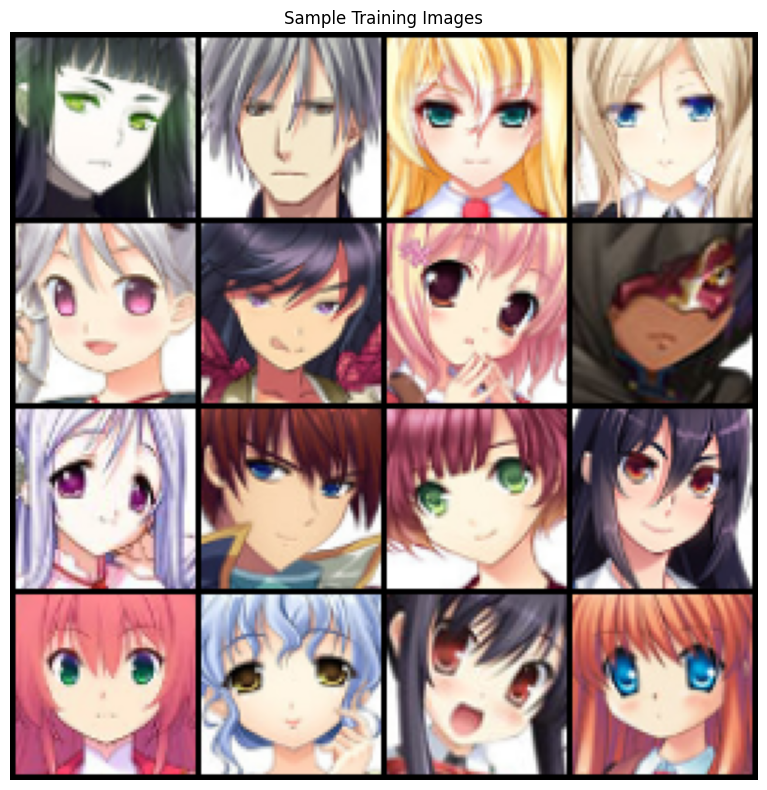

In [9]:
class AnimeFaceDataset(Dataset):
    EXTS = {'.jpg', '.jpeg', '.png', '.webp'}

    def __init__(self, root, transform=None):
        self.transform = transform
        self.paths = sorted([
            p for p in Path(root).rglob('*')
            if p.suffix.lower() in self.EXTS
        ])
        if not self.paths:
            raise FileNotFoundError(f"No images found in {root}")
        print(f"Found {len(self.paths):,} images")

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert('RGB')
        return self.transform(img) if self.transform else img


transform = transforms.Compose([
    transforms.Resize(cfg.IMAGE_SIZE + 4),
    transforms.CenterCrop(cfg.IMAGE_SIZE),
    transforms.RandomHorizontalFlip(0.5),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)   # → [-1, 1]
])

full_ds = AnimeFaceDataset(cfg.DATA_ROOT, transform)

if cfg.SUBSET_SIZE and cfg.SUBSET_SIZE < len(full_ds):
    idx = random.sample(range(len(full_ds)), cfg.SUBSET_SIZE)
    dataset = Subset(full_ds, idx)
    print(f" Subset: {cfg.SUBSET_SIZE:,} images")
else:
    dataset = full_ds

dataloader = DataLoader(
    dataset,
    batch_size  = cfg.BATCH_SIZE,
    shuffle     = True,
    num_workers = cfg.NUM_WORKERS,
    pin_memory  = True,
    drop_last   = True
)

print(f"{len(dataset):,} images | {len(dataloader):,} batches")

# Show sample grid
batch = next(iter(dataloader))
grid  = vutils.make_grid(batch[:16], nrow=4, normalize=True, value_range=(-1,1))
plt.figure(figsize=(8, 8))
plt.imshow(grid.permute(1,2,0).numpy())
plt.axis('off')
plt.title('Sample Training Images')
plt.tight_layout()
plt.show()

## DCGAN Architecture

In [10]:
def weights_init(m):
    cn = m.__class__.__name__
    if 'Conv' in cn:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif 'BatchNorm' in cn:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


class DCGANGenerator(nn.Module):
    """z (100,1,1) → image (3,64,64) via transposed convolutions."""
    def __init__(self, z=100, gf=64, ch=3):
        super().__init__()
        self.net = nn.Sequential(
            # 1×1 → 4×4
            nn.ConvTranspose2d(z,    gf*8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(gf*8), nn.ReLU(True),
            # 4×4 → 8×8
            nn.ConvTranspose2d(gf*8, gf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(gf*4), nn.ReLU(True),
            # 8×8 → 16×16
            nn.ConvTranspose2d(gf*4, gf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(gf*2), nn.ReLU(True),
            # 16×16 → 32×32
            nn.ConvTranspose2d(gf*2, gf,   4, 2, 1, bias=False),
            nn.BatchNorm2d(gf),   nn.ReLU(True),
            # 32×32 → 64×64
            nn.ConvTranspose2d(gf,   ch,   4, 2, 1, bias=False),
            nn.Tanh()
        )
    def forward(self, z): return self.net(z)


class DCGANDiscriminator(nn.Module):

    def __init__(self, df=64, ch=3):
        super().__init__()
        self.net = nn.Sequential(
            # 64×64 → 32×32
            nn.Conv2d(ch,   df,   4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, True),
            # 32×32 → 16×16
            nn.Conv2d(df,   df*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(df*2), nn.LeakyReLU(0.2, True),
            # 16×16 → 8×8
            nn.Conv2d(df*2, df*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(df*4), nn.LeakyReLU(0.2, True),
            # 8×8 → 4×4
            nn.Conv2d(df*4, df*8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(df*8), nn.LeakyReLU(0.2, True),
            # 4×4 → 1×1
            nn.Conv2d(df*8, 1,    4, 1, 0, bias=False)
        )
    def forward(self, x): return self.net(x).view(-1)


dcgan_G = DCGANGenerator(cfg.Z_DIM, cfg.G_FEATURES, cfg.CHANNELS).to(device)
dcgan_D = DCGANDiscriminator(cfg.D_FEATURES, cfg.CHANNELS).to(device)

if torch.cuda.device_count() > 1:
    dcgan_G = nn.DataParallel(dcgan_G)
    dcgan_D = nn.DataParallel(dcgan_D)

dcgan_G.apply(weights_init)
dcgan_D.apply(weights_init)

def count_params(m): return sum(p.numel() for p in m.parameters() if p.requires_grad)
print(f"DCGAN G params: {count_params(dcgan_G):,}")
print(f"DCGAN D params: {count_params(dcgan_D):,}")

DCGAN G params: 3,576,704
DCGAN D params: 2,765,568


## WGAN-GP Architecture

In [11]:
class WGANGenerator(nn.Module):
    """Same architecture as DCGANGenerator."""
    def __init__(self, z=100, gf=64, ch=3):
        super().__init__()
        self.net = nn.Sequential(
            nn.ConvTranspose2d(z,    gf*8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(gf*8), nn.ReLU(True),
            nn.ConvTranspose2d(gf*8, gf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(gf*4), nn.ReLU(True),
            nn.ConvTranspose2d(gf*4, gf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(gf*2), nn.ReLU(True),
            nn.ConvTranspose2d(gf*2, gf,   4, 2, 1, bias=False),
            nn.BatchNorm2d(gf),   nn.ReLU(True),
            nn.ConvTranspose2d(gf,   ch,   4, 2, 1, bias=False),
            nn.Tanh()
        )
    def forward(self, z): return self.net(z)


class WGANCritic(nn.Module):
    def __init__(self, df=64, ch=3):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(ch,   df,   4, 2, 1, bias=False),
            nn.InstanceNorm2d(df,   affine=True), nn.LeakyReLU(0.2, True),
            nn.Conv2d(df,   df*2, 4, 2, 1, bias=False),
            nn.InstanceNorm2d(df*2, affine=True), nn.LeakyReLU(0.2, True),
            nn.Conv2d(df*2, df*4, 4, 2, 1, bias=False),
            nn.InstanceNorm2d(df*4, affine=True), nn.LeakyReLU(0.2, True),
            nn.Conv2d(df*4, df*8, 4, 2, 1, bias=False),
            nn.InstanceNorm2d(df*8, affine=True), nn.LeakyReLU(0.2, True),
            nn.Conv2d(df*8, 1,    4, 1, 0, bias=False)   # NO Sigmoid
        )
    def forward(self, x): return self.net(x).view(-1)


def compute_gradient_penalty(critic, real, fake, device):

    B   = real.size(0)
    eps = torch.rand(B, 1, 1, 1, device=device).expand_as(real)
    interp = (eps * real + (1 - eps) * fake).requires_grad_(True)
    score  = critic(interp)
    grads  = torch.autograd.grad(
        outputs      = score,
        inputs       = interp,
        grad_outputs = torch.ones_like(score),
        create_graph = True,
        retain_graph = True,
        only_inputs  = True
    )[0]
    grad_norm = grads.view(B, -1).norm(2, dim=1)
    return ((grad_norm - 1) ** 2).mean()


wgan_G = WGANGenerator(cfg.Z_DIM, cfg.G_FEATURES, cfg.CHANNELS).to(device)
wgan_C = WGANCritic(cfg.D_FEATURES, cfg.CHANNELS).to(device)

if torch.cuda.device_count() > 1:
    wgan_G = nn.DataParallel(wgan_G)
    wgan_C = nn.DataParallel(wgan_C)

wgan_G.apply(weights_init)
wgan_C.apply(weights_init)

print(f"WGAN-GP G params: {count_params(wgan_G):,}")
print(f"WGAN-GP C params: {count_params(wgan_C):,}")

WGAN-GP G params: 3,576,704
WGAN-GP C params: 2,765,696


## Optimizers, Loss & Fixed Noise

In [12]:
# ── Optimizers ───────────────────────────────────────────────────────────────
dcgan_opt_G = optim.Adam(dcgan_G.parameters(), lr=cfg.LR, betas=cfg.BETAS)
dcgan_opt_D = optim.Adam(dcgan_D.parameters(), lr=cfg.LR, betas=cfg.BETAS)
wgan_opt_G  = optim.Adam(wgan_G.parameters(),  lr=cfg.LR, betas=cfg.BETAS)
wgan_opt_C  = optim.Adam(wgan_C.parameters(),  lr=cfg.LR, betas=cfg.BETAS)

# ── Loss (BCEWithLogitsLoss = Sigmoid + BCE, autocast-safe) ──────────────────
criterion = nn.BCEWithLogitsLoss()

# ── Mixed-precision scalers (updated API) ────────────────────────────────────
scaler_dcgan_G = torch.amp.GradScaler('cuda')
scaler_dcgan_D = torch.amp.GradScaler('cuda')
scaler_wgan_G  = torch.amp.GradScaler('cuda')
# ── Label helpers ────────────────────────────────────────────────────────────
def real_labels(n): return torch.full((n,), 0.9, device=device)   # label smoothing
def fake_labels(n): return torch.zeros(n, device=device)

# ── Fixed noise for consistent visualisation ─────────────────────────────────
fixed_noise = torch.randn(cfg.N_SAMPLES, cfg.Z_DIM, 1, 1, device=device)

print("Optimizers, loss, scalers ready")
print(f"   Fixed noise shape: {fixed_noise.shape}")

Optimizers, loss, scalers ready
   Fixed noise shape: torch.Size([16, 100, 1, 1])


## Helper Utilities

In [13]:
def free_memory():
    """Release unused GPU memory after each epoch."""
    gc.collect()
    torch.cuda.empty_cache()


def gpu_mem():
    if not torch.cuda.is_available(): return 'CPU'
    a = torch.cuda.memory_allocated(device) / 1e9
    r = torch.cuda.memory_reserved(device)  / 1e9
    return f'{a:.1f}/{r:.1f} GB'


def show_samples(G, noise, epoch, name, out_dir, nrow=4):
    G.eval()
    with torch.no_grad():
        imgs = G(noise).cpu()
    G.train()
    grid = vutils.make_grid(imgs, nrow=nrow, normalize=True, value_range=(-1,1))
    path = f'{out_dir}/epoch_{epoch:04d}.png'
    vutils.save_image(grid, path)
    plt.figure(figsize=(7, 7))
    plt.imshow(grid.permute(1,2,0).numpy())
    plt.axis('off')
    plt.title(f'{name} — Epoch {epoch}', fontsize=13)
    plt.tight_layout()
    plt.show()


def save_ckpt(epoch, G, D, oG, oD, name):
    p = f'{cfg.CKPT_DIR}/{name}_ep{epoch:04d}.pt'
    torch.save({'epoch': epoch,
                'G': G.state_dict(), 'D': D.state_dict(),
                'oG': oG.state_dict(), 'oD': oD.state_dict()}, p)
    print(f'   💾 Saved: {p}')


def plot_losses(g_ep, d_ep, title, glabel='G Loss', dlabel='D/C Loss'):
    ep = range(1, len(g_ep)+1)
    fig, (a1, a2) = plt.subplots(1, 2, figsize=(13, 4))
    a1.plot(ep, g_ep, 'royalblue'); a1.set_title(glabel); a1.grid(alpha=0.3)
    a2.plot(ep, d_ep, 'tomato');    a2.set_title(dlabel); a2.grid(alpha=0.3)
    for ax in (a1, a2):
        ax.set_xlabel('Epoch'); ax.set_ylabel('Loss')
    fig.suptitle(title, fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig(f'{cfg.SAMPLE_DIR}/{title.replace(" ","_")}.png', dpi=120)
    plt.show()


print("Helpers ready")

Helpers ready


## Train DCGAN

 TRAINING: DCGAN (Baseline)
Batch items: 32


DCGAN 1/5:   0%|                                                       | 0/156 [00:00<?, ?it/s]

Ep  1/5 | G=7.3158 | D=0.9496 | 9.1s | mem=0.1/0.2 GB


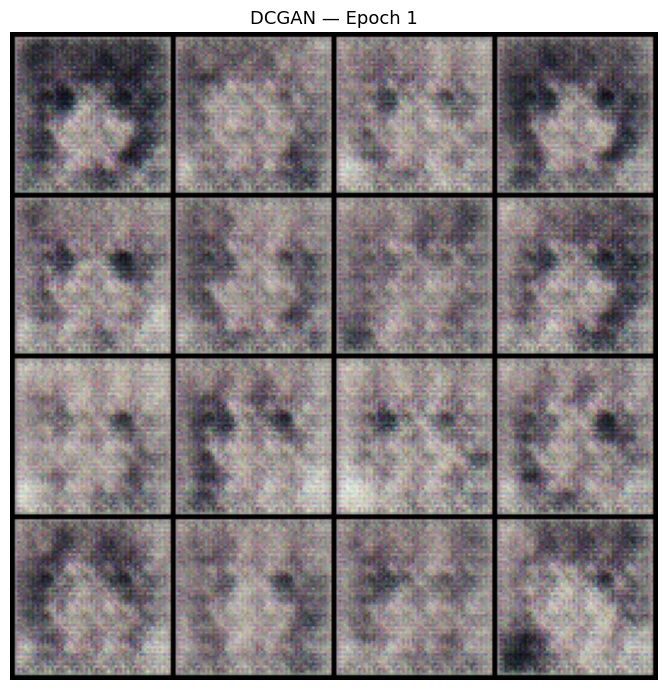

DCGAN 2/5:   0%|                                                       | 0/156 [00:00<?, ?it/s]

Ep  2/5 | G=4.7883 | D=0.8946 | 10.1s | mem=0.1/0.2 GB


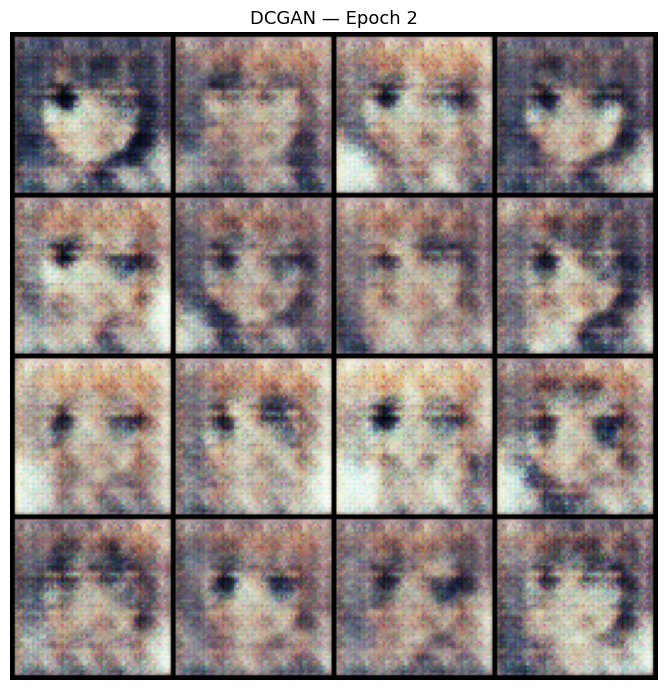

DCGAN 3/5:   0%|                                                       | 0/156 [00:00<?, ?it/s]

Ep  3/5 | G=4.6801 | D=0.7854 | 9.7s | mem=0.1/0.2 GB


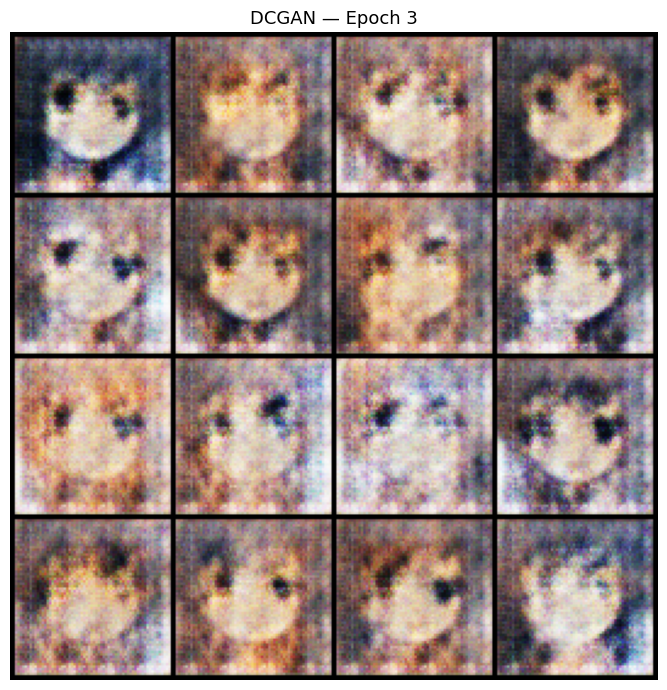

DCGAN 4/5:   0%|                                                       | 0/156 [00:00<?, ?it/s]

Ep  4/5 | G=4.4580 | D=0.8395 | 9.1s | mem=0.1/0.2 GB


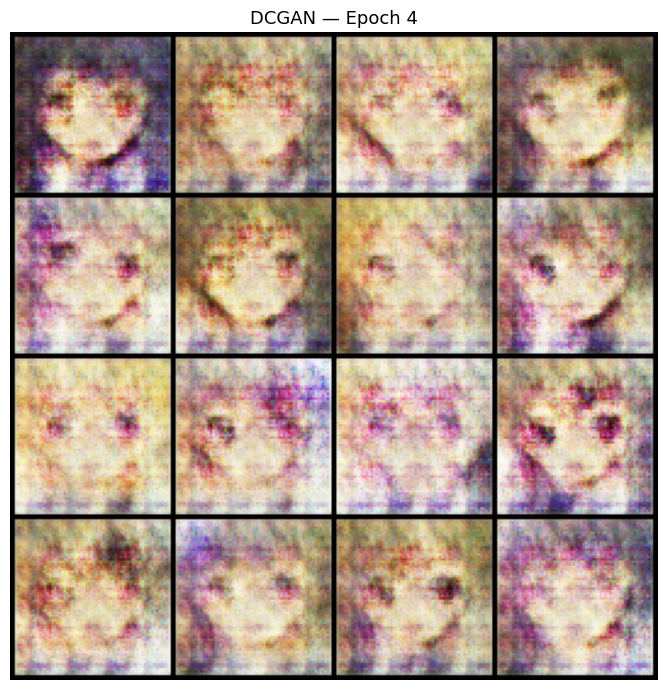

DCGAN 5/5:   0%|                                                       | 0/156 [00:00<?, ?it/s]

Ep  5/5 | G=4.5992 | D=0.8182 | 10.0s | mem=0.1/0.2 GB


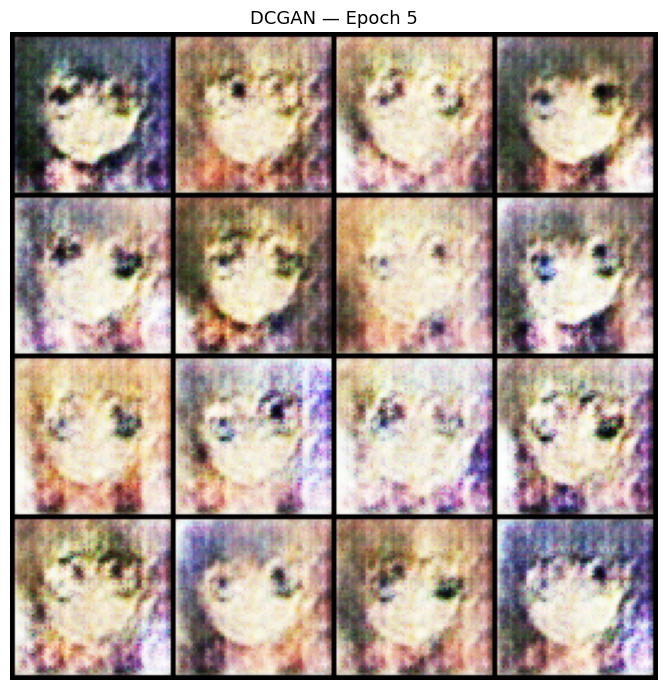

   💾 Saved: ./checkpoints/dcgan_ep0005.pt

DCGAN done!


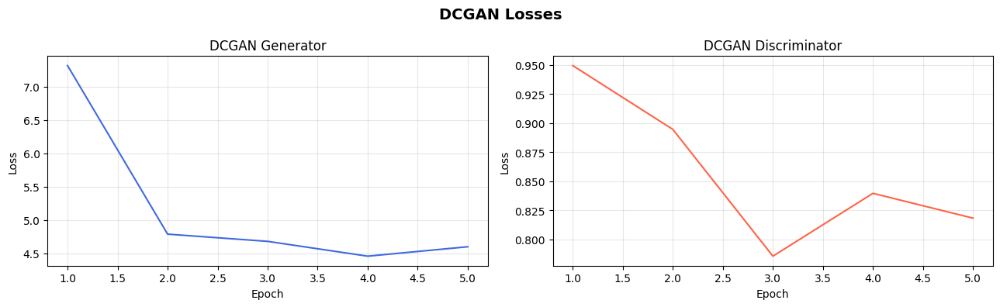

In [14]:
print("="*55)
print(" TRAINING: DCGAN (Baseline)")
print("="*55)

dcgan_G_ep, dcgan_D_ep = [], []
dcgan_G.train(); dcgan_D.train()
print(f"Batch items: {len(next(iter(dataloader)))}")
for epoch in range(1, cfg.DCGAN_EPOCHS + 1):
    g_sum = d_sum = 0.0
    t0 = time.time()

    pbar = tqdm(dataloader, desc=f'DCGAN {epoch}/{cfg.DCGAN_EPOCHS}',
                leave=False, ncols=95)

    for real in pbar:
        real = real.to(device, non_blocking=True)
        B    = real.size(0)

        # ── Train Discriminator ──────────────────────────────────────────────
        dcgan_D.zero_grad(set_to_none=True)
        with torch.amp.autocast('cuda'):
            # Real pass
            loss_D_real = criterion(dcgan_D(real), real_labels(B))
            # Fake pass
            z         = torch.randn(B, cfg.Z_DIM, 1, 1, device=device)
            fake      = dcgan_G(z).detach()
            loss_D_fake = criterion(dcgan_D(fake), fake_labels(B))
            loss_D    = loss_D_real + loss_D_fake

        scaler_dcgan_D.scale(loss_D).backward()
        scaler_dcgan_D.step(dcgan_opt_D)
        scaler_dcgan_D.update()

        # ── Train Generator ──────────────────────────────────────────────────
        dcgan_G.zero_grad(set_to_none=True)
        with torch.amp.autocast('cuda'):
            z      = torch.randn(B, cfg.Z_DIM, 1, 1, device=device)
            fake   = dcgan_G(z)
            loss_G = criterion(dcgan_D(fake), real_labels(B))  # fool D

        scaler_dcgan_G.scale(loss_G).backward()
        scaler_dcgan_G.step(dcgan_opt_G)
        scaler_dcgan_G.update()

        g_sum += loss_G.item()
        d_sum += loss_D.item()
        pbar.set_postfix({'D': f'{loss_D.item():.3f}',
                          'G': f'{loss_G.item():.3f}',
                          'mem': gpu_mem()})

    # ── End of epoch ─────────────────────────────────────────────────────────
    n  = len(dataloader)
    ag = g_sum / n
    ad = d_sum / n
    dcgan_G_ep.append(ag)
    dcgan_D_ep.append(ad)

    print(f"Ep {epoch:2d}/{cfg.DCGAN_EPOCHS} | G={ag:.4f} | D={ad:.4f} | "
          f"{time.time()-t0:.1f}s | mem={gpu_mem()}")

    if epoch % cfg.SAMPLE_EVERY == 0:
        show_samples(dcgan_G, fixed_noise, epoch, 'DCGAN',
                     f'{cfg.SAMPLE_DIR}/dcgan')

    if epoch % cfg.SAVE_EVERY == 0:
        save_ckpt(epoch, dcgan_G, dcgan_D, dcgan_opt_G, dcgan_opt_D, 'dcgan')

    free_memory()   # ← clear GPU cache after every epoch

print("\nDCGAN done!")
plot_losses(dcgan_G_ep, dcgan_D_ep, 'DCGAN Losses',
            'DCGAN Generator', 'DCGAN Discriminator')

## Train WGAN-GP

  TRAINING: WGAN-GP (Advanced)


WGAN-GP 1/5:   0%|                                                     | 0/156 [00:00<?, ?it/s]

Ep  1/5 | G=1.7183 | C=1.2908 | 35.9s | mem=0.2/0.4 GB


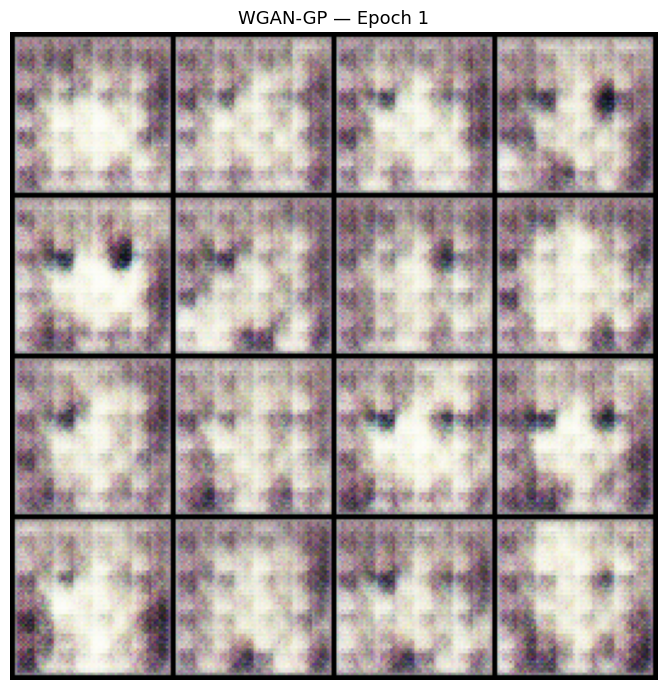

WGAN-GP 2/5:   0%|                                                     | 0/156 [00:00<?, ?it/s]

Ep  2/5 | G=9.4660 | C=-12.3796 | 37.7s | mem=0.2/0.4 GB


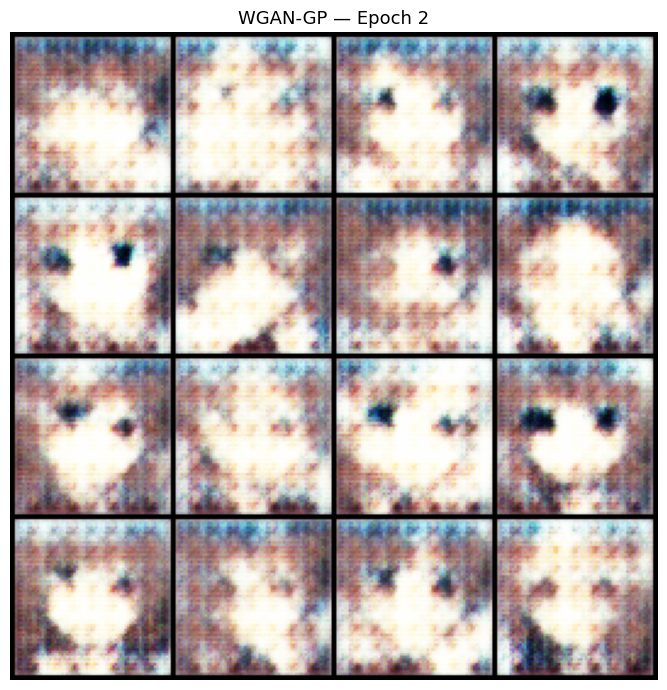

WGAN-GP 3/5:   0%|                                                     | 0/156 [00:00<?, ?it/s]

Ep  3/5 | G=10.6921 | C=-15.7591 | 37.1s | mem=0.2/0.4 GB


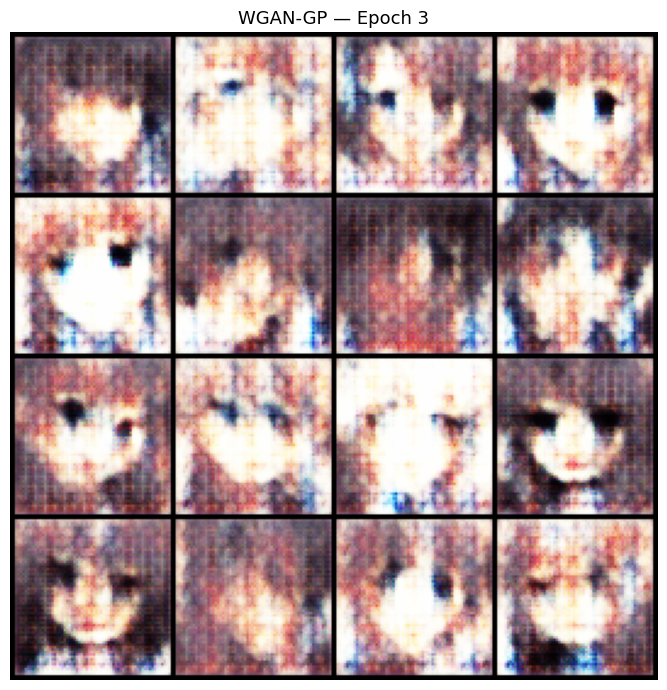

WGAN-GP 4/5:   0%|                                                     | 0/156 [00:00<?, ?it/s]

Ep  4/5 | G=8.2431 | C=-14.0168 | 37.2s | mem=0.2/0.4 GB


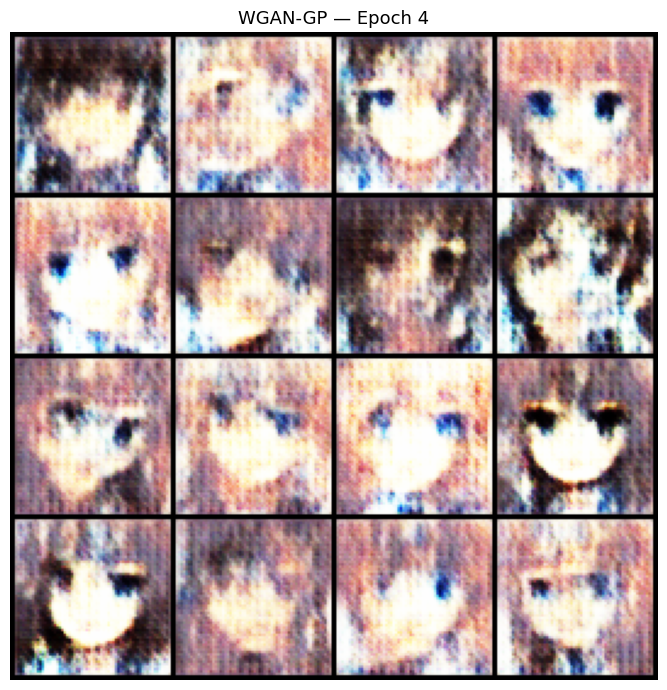

WGAN-GP 5/5:   0%|                                                     | 0/156 [00:00<?, ?it/s]

Ep  5/5 | G=6.8110 | C=-12.7401 | 37.6s | mem=0.2/0.4 GB


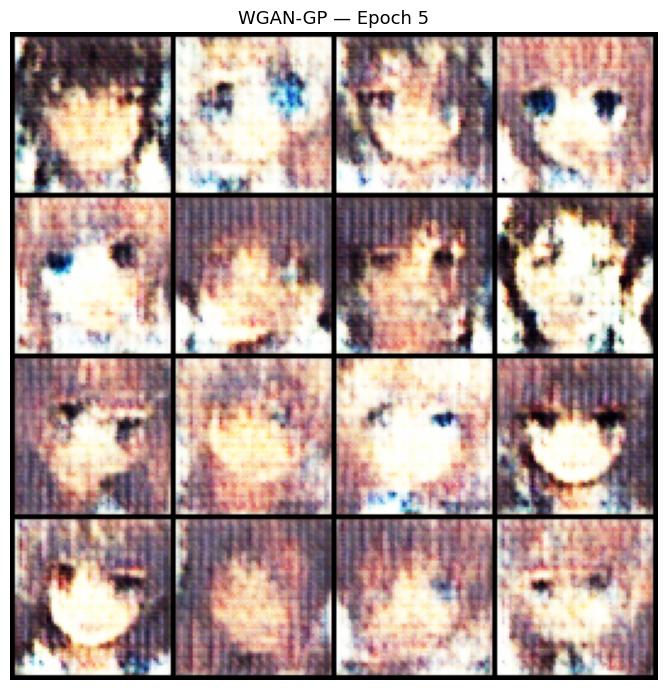

   💾 Saved: ./checkpoints/wgan_gp_ep0005.pt

WGAN-GP done!


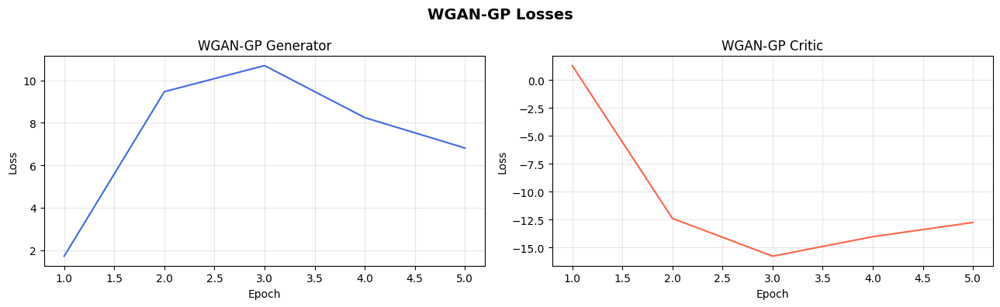

In [15]:
print("="*55)
print("  TRAINING: WGAN-GP (Advanced)")
print("="*55)

wgan_G_ep, wgan_C_ep = [], []
wgan_G.train(); wgan_C.train()

for epoch in range(1, cfg.WGAN_EPOCHS + 1):
    g_sum = c_sum = 0.0
    g_steps = 0
    t0 = time.time()

    pbar = tqdm(dataloader, desc=f'WGAN-GP {epoch}/{cfg.WGAN_EPOCHS}',
                leave=False, ncols=95)

    for real in pbar:
        real = real.to(device, non_blocking=True)
        B    = real.size(0)

        # ── Train Critic (CRITIC_ITERS times) ────────────────────────────────
        for _ in range(cfg.CRITIC_ITERS):
            wgan_C.zero_grad(set_to_none=True)

            z    = torch.randn(B, cfg.Z_DIM, 1, 1, device=device)
            fake = wgan_G(z).detach()

            c_real = wgan_C(real)
            c_fake = wgan_C(fake)

            gp     = compute_gradient_penalty(
                        wgan_C, real.detach(), fake.detach(), device)

            # Wasserstein loss: minimize E[C(fake)] - E[C(real)] + λ·GP
            loss_C = c_fake.mean() - c_real.mean() + cfg.LAMBDA_GP * gp
            loss_C.backward()
            wgan_opt_C.step()

            c_sum += loss_C.item()

        # ── Train Generator (once per CRITIC_ITERS) ──────────────────────────
        wgan_G.zero_grad(set_to_none=True)
        with torch.amp.autocast('cuda'):
            z      = torch.randn(B, cfg.Z_DIM, 1, 1, device=device)
            fake   = wgan_G(z)
            # Maximize E[C(fake)] ↔ minimize -E[C(fake)]
            loss_G = -wgan_C(fake).mean()

        scaler_wgan_G.scale(loss_G).backward()
        scaler_wgan_G.step(wgan_opt_G)
        scaler_wgan_G.update()

        g_sum   += loss_G.item()
        g_steps += 1

        pbar.set_postfix({'C': f'{loss_C.item():.3f}',
                          'G': f'{loss_G.item():.3f}',
                          'GP': f'{gp.item():.3f}',
                          'mem': gpu_mem()})

    # ── End of epoch ─────────────────────────────────────────────────────────
    ag = g_sum / max(g_steps, 1)
    ac = c_sum / (len(dataloader) * cfg.CRITIC_ITERS)
    wgan_G_ep.append(ag)
    wgan_C_ep.append(ac)

    print(f"Ep {epoch:2d}/{cfg.WGAN_EPOCHS} | G={ag:.4f} | C={ac:.4f} | "
          f"{time.time()-t0:.1f}s | mem={gpu_mem()}")

    if epoch % cfg.SAMPLE_EVERY == 0:
        show_samples(wgan_G, fixed_noise, epoch, 'WGAN-GP',
                     f'{cfg.SAMPLE_DIR}/wgan_gp')

    if epoch % cfg.SAVE_EVERY == 0:
        save_ckpt(epoch, wgan_G, wgan_C, wgan_opt_G, wgan_opt_C, 'wgan_gp')

    free_memory()   # ← clear GPU cache after every epoch

print("\nWGAN-GP done!")
plot_losses(wgan_G_ep, wgan_C_ep, 'WGAN-GP Losses',
            'WGAN-GP Generator', 'WGAN-GP Critic')

## Loss Comparison

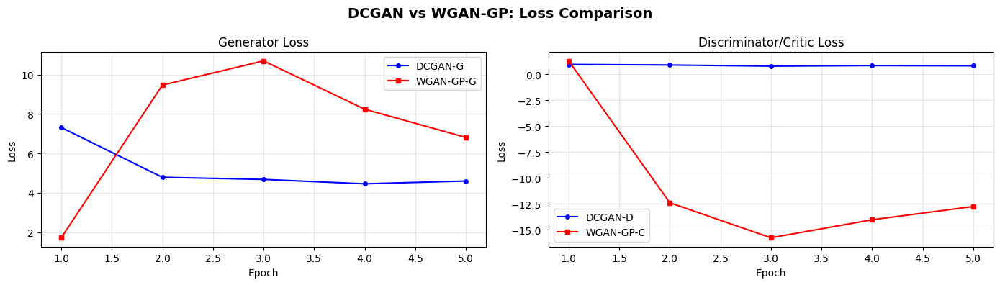

In [16]:
fig, axes = plt.subplots(1, 2, figsize=(14, 4))

ep_d = range(1, len(dcgan_G_ep)+1)
ep_w = range(1, len(wgan_G_ep)+1)

axes[0].plot(ep_d, dcgan_G_ep, 'b-o', ms=4, label='DCGAN-G')
axes[0].plot(ep_w, wgan_G_ep,  'r-s', ms=4, label='WGAN-GP-G')
axes[0].set_title('Generator Loss'); axes[0].legend(); axes[0].grid(alpha=0.3)
axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Loss')

axes[1].plot(ep_d, dcgan_D_ep, 'b-o', ms=4, label='DCGAN-D')
axes[1].plot(ep_w, wgan_C_ep,  'r-s', ms=4, label='WGAN-GP-C')
axes[1].set_title('Discriminator/Critic Loss'); axes[1].legend(); axes[1].grid(alpha=0.3)
axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Loss')

fig.suptitle('DCGAN vs WGAN-GP: Loss Comparison', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(f'{cfg.SAMPLE_DIR}/loss_comparison.png', dpi=150)
plt.show()

## Visual Comparison

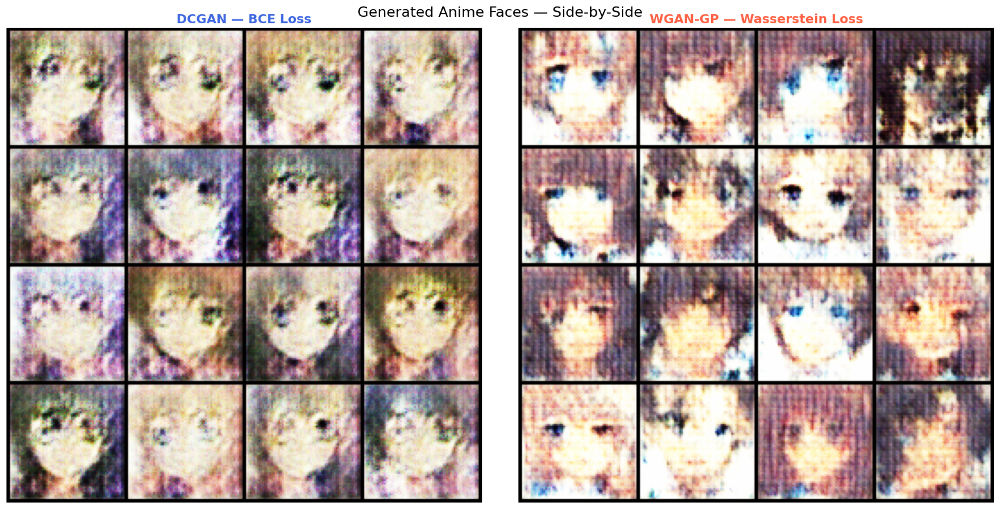

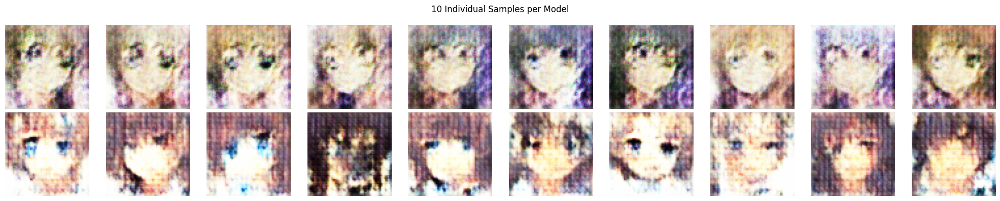

In [17]:
def gen_samples(G, n=16):
    G.eval()
    with torch.no_grad():
        z = torch.randn(n, cfg.Z_DIM, 1, 1, device=device)
        s = G(z).cpu()
    G.train()
    return s

dcgan_s = gen_samples(dcgan_G, 16)
wgan_s  = gen_samples(wgan_G,  16)

dg = vutils.make_grid(dcgan_s, nrow=4, normalize=True, value_range=(-1,1))
wg = vutils.make_grid(wgan_s,  nrow=4, normalize=True, value_range=(-1,1))

fig, axes = plt.subplots(1, 2, figsize=(16, 8))
axes[0].imshow(dg.permute(1,2,0).numpy()); axes[0].axis('off')
axes[0].set_title('DCGAN — BCE Loss', fontsize=14, color='royalblue', fontweight='bold')
axes[1].imshow(wg.permute(1,2,0).numpy()); axes[1].axis('off')
axes[1].set_title('WGAN-GP — Wasserstein Loss', fontsize=14, color='tomato', fontweight='bold')
fig.suptitle('Generated Anime Faces — Side-by-Side', fontsize=16)
plt.tight_layout()
plt.savefig(f'{cfg.SAMPLE_DIR}/final_comparison.png', dpi=150)
plt.show()

# ── 10 close-up samples ───────────────────────────────────────────────────────
fig, axes = plt.subplots(2, 10, figsize=(20, 4))
fig.suptitle('10 Individual Samples per Model', fontsize=12)
for j in range(10):
    for row, s, label in [(0, dcgan_s, 'DCGAN'), (1, wgan_s, 'WGAN-GP')]:
        img = np.clip((s[j].permute(1,2,0).numpy() + 1) / 2, 0, 1)
        axes[row, j].imshow(img); axes[row, j].axis('off')
        if j == 0: axes[row, j].set_ylabel(label, fontsize=9)
plt.tight_layout()
plt.savefig(f'{cfg.SAMPLE_DIR}/closeup_10.png', dpi=150)
plt.show()

## Diversity Metrics


  DIVERSITY METRICS  (↑ higher = better)
  Metric                          DCGAN  WGAN-GP
--------------------------------------------------
  Mean Pairwise L2                53.30    70.43
  Pixel Std Dev                  0.3203   0.4401


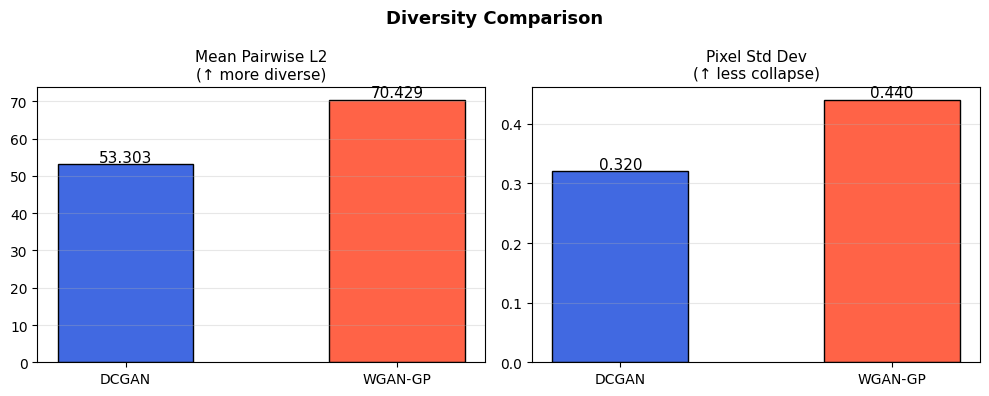

In [18]:
def pairwise_l2(imgs, n_pairs=300):
    flat = imgs.view(imgs.size(0), -1).float()
    N    = flat.size(0)
    dists = [(flat[i] - flat[j]).norm(2).item()
             for i, j in [random.sample(range(N), 2) for _ in range(min(n_pairs, N*(N-1)//2))]]
    return float(np.mean(dists))

def pixel_std(imgs):
    return imgs.std(dim=0).mean().item()

dcgan_eval = gen_samples(dcgan_G, 128)
wgan_eval  = gen_samples(wgan_G,  128)

dl = pairwise_l2(dcgan_eval)
wl = pairwise_l2(wgan_eval)
ds = pixel_std(dcgan_eval)
ws = pixel_std(wgan_eval)

print("\n" + "="*50)
print("  DIVERSITY METRICS  (↑ higher = better)")
print("="*50)
print(f"  {'Metric':<28} {'DCGAN':>8} {'WGAN-GP':>8}")
print("-"*50)
print(f"  {'Mean Pairwise L2':<28} {dl:>8.2f} {wl:>8.2f}")
print(f"  {'Pixel Std Dev':<28} {ds:>8.4f} {ws:>8.4f}")
print("="*50)

fig, axes = plt.subplots(1, 2, figsize=(10, 4))
for ax, title, vals in zip(
        axes,
        ['Mean Pairwise L2\n(↑ more diverse)', 'Pixel Std Dev\n(↑ less collapse)'],
        [(dl, wl), (ds, ws)]):
    bars = ax.bar(['DCGAN', 'WGAN-GP'], vals, color=['royalblue','tomato'],
                  edgecolor='black', width=0.5)
    ax.set_title(title, fontsize=11); ax.grid(axis='y', alpha=0.3)
    for b in bars:
        ax.text(b.get_x()+b.get_width()/2, b.get_height()*1.01,
                f'{b.get_height():.3f}', ha='center', fontsize=11)
fig.suptitle('Diversity Comparison', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(f'{cfg.SAMPLE_DIR}/diversity.png', dpi=150)
plt.show()

## Gradio App

In [19]:
import gradio as gr

dcgan_G.eval(); wgan_G.eval()

def t2pil(t):
    """CHW tensor in [-1,1] → PIL Image."""
    arr = ((t.permute(1,2,0).numpy() + 1) / 2 * 255).clip(0,255).astype(np.uint8)
    return Image.fromarray(arr)

def make_grid_pil(G, n, seed):
    torch.manual_seed(int(seed))
    with torch.no_grad():
        z = torch.randn(int(n), cfg.Z_DIM, 1, 1, device=device)
        imgs = G(z).cpu()
    grid = vutils.make_grid(imgs, nrow=4, normalize=True, value_range=(-1,1))
    return t2pil(grid)

def compare(n, seed):
    return make_grid_pil(dcgan_G, n, seed), make_grid_pil(wgan_G, n, seed)

def single(model, n, seed):
    G = dcgan_G if model == 'DCGAN' else wgan_G
    return make_grid_pil(G, n, seed)

with gr.Blocks(title='GAN Demo', theme=gr.themes.Soft()) as demo:
    gr.Markdown("""# DCGAN vs WGAN-GP — Anime Face Generation
    Compare how Wasserstein Loss + Gradient Penalty reduces mode collapse.""")

    with gr.Tab("Side-by-Side Comparison"):
        with gr.Row():
            seed_s = gr.Slider(0, 9999, value=42, step=1, label='Seed')
            n_s    = gr.Slider(4, 16,   value=16, step=4, label='Samples')
            btn    = gr.Button('Generate', variant='primary')
        with gr.Row():
            out_d = gr.Image(label='DCGAN (BCE Loss)',            type='pil')
            out_w = gr.Image(label='WGAN-GP (Wasserstein + GP)', type='pil')
        btn.click(compare, [n_s, seed_s], [out_d, out_w])

    with gr.Tab("🔬 Single Model"):
        with gr.Row():
            m_r    = gr.Radio(['DCGAN','WGAN-GP'], value='WGAN-GP', label='Model')
            seed_r = gr.Slider(0, 9999, value=0,  step=1, label='Seed')
            n_r    = gr.Slider(4, 16,   value=16, step=4, label='Samples')
            btn2   = gr.Button('Generate', variant='primary')
        out_s = gr.Image(label='Output', type='pil')
        btn2.click(single, [m_r, n_r, seed_r], out_s)

    with gr.Tab("Model Info"):
        gr.Markdown(f"""
        ## Architecture Summary
        | | DCGAN | WGAN-GP |
        |---|---|---|
        | **Discriminator/Critic** | Conv + BatchNorm + LeakyReLU + **Sigmoid** | Conv + InstanceNorm + LeakyReLU (**no sigmoid**) |
        | **Loss** | BCEWithLogitsLoss | Wasserstein Distance |
        | **Gradient constraint** | None | Gradient Penalty (λ={cfg.LAMBDA_GP}) |
        | **Critic updates/G update** | 1 | {cfg.CRITIC_ITERS} |
        | **G params** | {count_params(dcgan_G):,} | {count_params(wgan_G):,} |

        ## Why WGAN-GP beats DCGAN
        - **BCE loss saturates** when discriminator is too good → vanishing gradients → mode collapse
        - **Wasserstein distance** always provides a meaningful gradient signal
        - **Gradient Penalty** enforces 1-Lipschitz constraint for stable critic training
        """)

demo.launch(share=True, server_port=7860)

/tmp/ipykernel_1493/4215699150.py:25: DeprecationWarning: The 'theme' parameter in the Blocks constructor will be removed in Gradio 6.0. You will need to pass 'theme' to Blocks.launch() instead.
  with gr.Blocks(title='GAN Demo', theme=gr.themes.Soft()) as demo:


Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://8252960510bf3b9f16.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


## Save Final Models

In [ ]:
torch.save(dcgan_G.state_dict(), f'{cfg.CKPT_DIR}/dcgan_G_final.pt')
torch.save(dcgan_D.state_dict(), f'{cfg.CKPT_DIR}/dcgan_D_final.pt')
torch.save(wgan_G.state_dict(),  f'{cfg.CKPT_DIR}/wgan_G_final.pt')
torch.save(wgan_C.state_dict(),  f'{cfg.CKPT_DIR}/wgan_C_final.pt')

with open(f'{cfg.CKPT_DIR}/losses.json', 'w') as f:
    json.dump({'dcgan_G': dcgan_G_ep, 'dcgan_D': dcgan_D_ep,
               'wgan_G':  wgan_G_ep,  'wgan_C':  wgan_C_ep}, f, indent=2)

print("="*50)
print("  ALL DONE")
print("="*50)
print(f"  Dataset      : Anime Faces ({len(dataset):,} images)")
print(f"  DCGAN epochs : {cfg.DCGAN_EPOCHS}")
print(f"  WGAN epochs  : {cfg.WGAN_EPOCHS}")
print(f"  Final G Loss : DCGAN={dcgan_G_ep[-1]:.4f}  WGAN={wgan_G_ep[-1]:.4f}")
print("="*50)
print("\n Saved files:")
for p in sorted(Path(cfg.CKPT_DIR).glob('*')):
    print(f"   {p}")